In [35]:
import os
import warnings
import time
from copy import deepcopy
from glob import glob

import numpy as np 

from scipy.stats import chisquare
from scipy.interpolate import interp1d, interp2d

from astropy.io import fits
from astropy.stats import sigma_clipped_stats, sigma_clip
from astropy.stats import mad_std, gaussian_sigma_to_fwhm
from astropy.table import Table
from astropy.modeling import models, fitting, functional_models, Parameter, custom_model
from astropy.nddata import Cutout2D
from astropy.wcs import WCS
from astropy.utils.exceptions import AstropyWarning
from astropy import units as u
from astropy.convolution import convolve, Gaussian2DKernel
from astropy import units as u 
from astropy.nddata import CCDData, Cutout2D
from astropy.wcs.utils import proj_plane_pixel_scales

from astropy.stats import gaussian_fwhm_to_sigma

from photutils import detect_threshold
from photutils import deblend_sources
from photutils import source_properties, SourceProperties
from photutils import detect_sources
from photutils import source_properties, EllipticalAperture

from astropy.convolution import Gaussian2DKernel
from astropy.stats import gaussian_fwhm_to_sigma
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
from astropy.stats import SigmaClip

from photutils import Background2D, MedianBackground
from photutils import DAOStarFinder
from photutils import aperture_photometry, CircularAperture, CircularAnnulus, EllipticalAnnulus
from photutils.isophote import EllipseGeometry, Ellipse

In [2]:
from lcbg.utils import cutout, measure_fwhm, pixel_to_angular, angular_to_pixel, natural_sort, plot_target, closest_value_index, get_interpolated_values
from lcbg.fitting import print_model_params, plot_fit, fit_model, model_subtract, Moffat2D, Nuker2D, model_to_image
from lcbg.segmentation import get_source_e, get_source_ellip, get_source_theta, plot_segment_residual, plot_segments, make_segments, get_source_position, deblend_segments, segm_mask, masked_segm_image, make_kernel
from lcbg.photometry import object_photometry, photometry_step, flux_to_abmag, order_cat, calculate_photometic_density, plot_apertures, radial_elliptical_aperture, radial_elliptical_annulus, plot_apertures
from lcbg.cosmology import cosmo_aperture_diameter
from lcbg.petrosian import calculate_petrosian, calculate_petrosian_r, calculate_r_half_light, calculate_r_total_flux, plot_petrosian, calculate_concentration_index, estimate_n

In [3]:
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import gridspec
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
plt.rcParams['figure.figsize'] = [12, 12]
plt.rcParams['image.origin'] = 'lower'

In [4]:
import ipywidgets as widgets
from IPython.display import display

# Define Paths

In [5]:
acs_filter_list = ['f435w', 'f606w', 'f814w']
wfc3_filter_list = ['f105w', 'f125w', 'f140w', 'f160w']

input_data_formatter = "https://archive.stsci.edu/pub/hlsp/frontier/abell2744/images/hst/v1.0/hlsp_frontier_hst_{}-60mas_abell2744_{}_v1.0_drz.fits"


In [6]:
data_paths = {}
for f in acs_filter_list:
    data_paths[f] = input_data_formatter.format('acs', f)
    
for f in wfc3_filter_list:
    data_paths[f] = input_data_formatter.format('wfc3', f)
    
petrosian_cat_collection = {}

# User Input

In [121]:
show_plots = True

noise_cutout_center = (2760, 3420)
noise_cutout_size = 70

# Center of cluster:
cx, cy = [2412, 2519]
data_cutout_size = 2000

# Detection Image

### Combine Image

In [113]:
redo = False 
if os.path.isfile('combined_data.fits') and not redo:
    combined_data = CCDData.read('combined_data.fits')
else:
    combined_data = None
    combined_wht = None 

    for current_filter in wfc3_filter_list:
        print(current_filter)

        input_data_path = data_paths[current_filter]
        input_wht_path = data_paths[current_filter].replace("drz.fits", "wht.fits")

        print("Load Data")
        data = CCDData.read(input_data_path)

        print("Load Wht")
        wht = CCDData.read(input_wht_path, unit=u.electron/u.count)
        
        header = data.header 

        if combined_data is None:
            combined_data = data.data * wht.data 
            combined_wht = wht.data  
        else:
            combined_data += data.data  * wht.data  
            combined_wht += wht.data  

    combined_data /= combined_wht

    combined_data = CCDData(combined_data, unit=u.electron/u.count, wcs=data.wcs)
    combined_data.write('combined_data.fits')

### Estimate data noise at dark area

-0.00014991818 0.0021490041981451213 0.0057306778617203236


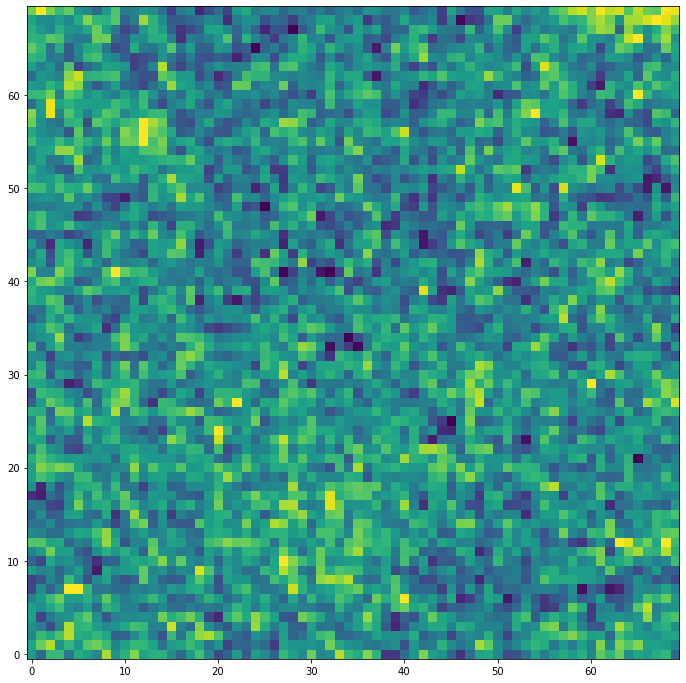

In [114]:
combined_noise_cutout = Cutout2D(combined_data, noise_cutout_center, noise_cutout_size)

combined_noise_mean = combined_noise_cutout.data.mean()
combined_noise_sigma = combined_noise_cutout.data.std()
combined_noise_3_sigma = combined_noise_sigma * 3.
combined_noise_8_sigma = combined_noise_sigma * 8.

print(combined_noise_mean, combined_noise_3_sigma, combined_noise_8_sigma)
    
if show_plots:
    plt.imshow(combined_noise_cutout.data, 
               vmax=combined_noise_mean+combined_noise_3_sigma, 
               vmin=combined_noise_mean-combined_noise_3_sigma)
    plt.show()

### Cutout Detection Image

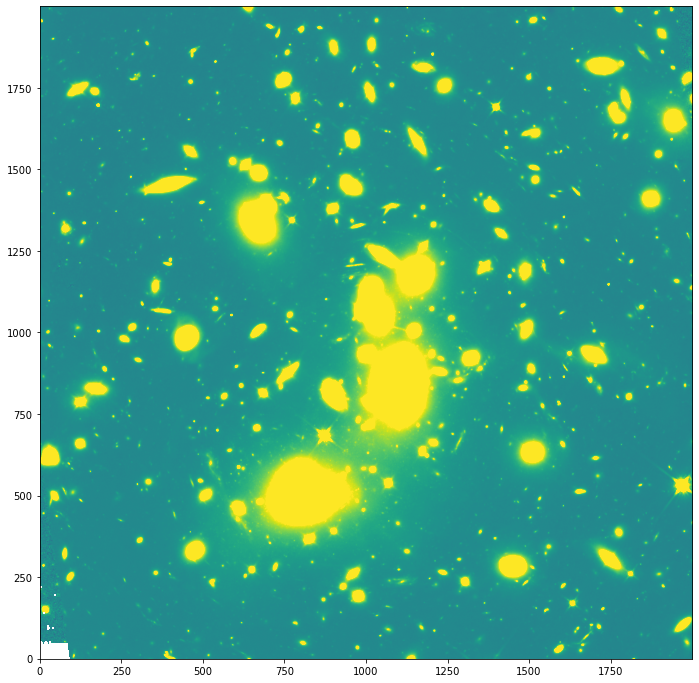

In [122]:
combined_image = Cutout2D(combined_data, (cx, cy), data_cutout_size, copy=True)

# Compute image stats
combined_image_min = combined_image.data.min()
combined_image_max = combined_image.data.max()
combined_image_mean = combined_image.data.mean()
combined_image_sigma = combined_image.data.std()
combined_image_3_sigma = combined_image_sigma * 3.
combined_image_8_sigma = combined_image_sigma * 8.

combined_image_clipped_mean, combined_image_clipped_median, combined_image_clipped_std = sigma_clipped_stats(combined_image.data, sigma=3.0)

# Subtract Noise
combined_image.data  -= combined_image_clipped_mean

# Set min and max values for all plots
vmin = -10 * combined_image_clipped_std
vmax = +10 * combined_image_clipped_std

if show_plots:
    plt.imshow(combined_image.data, vmin=vmin, vmax=vmax)
    plt.show()

#print(image_mean)

### Segmentation and Main Catalog

Num of Targets: 1402


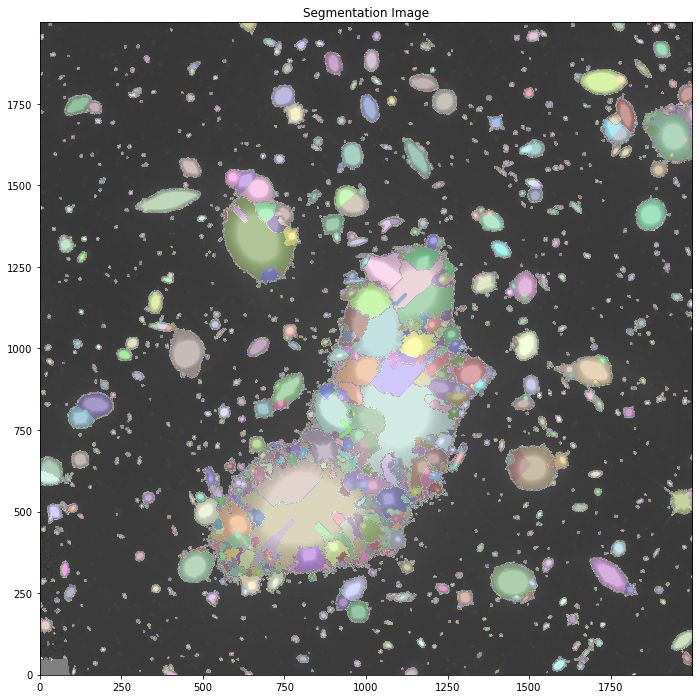

In [203]:
# Define detect threshold
nsigma = np.ones_like(combined_image.data)
nsigma[:, :] = combined_noise_8_sigma 

# Define smoothing kernel
kernel_size = 3
fwhm = 3
npixels = 10

# Make segmentation map
combined_segm = make_segments(combined_image.data, nsigma=nsigma, kernel_size=kernel_size, fwhm=fwhm, npixels=npixels)

# Deblend segmentation map
combined_segm_deblend = deblend_segments(combined_image.data, combined_segm, contrast=0, nlevels=50,
                                         kernel_size=kernel_size, fwhm=fwhm, npixels=npixels)

# Remove border sources
#combined_segm_deblend.remove_border_labels(200)

# Make catalog
combined_cat = source_properties(combined_image.data, combined_segm_deblend, wcs=combined_image.wcs)

# Display source properties
print("Num of Targets:", len(combined_cat))

# Plot segments
if show_plots:
    plot_segments(combined_segm_deblend, combined_image.data, vmin=vmin, vmax=vmax)
    plt.show()

# Main Loop

f105w
Load data and vitals


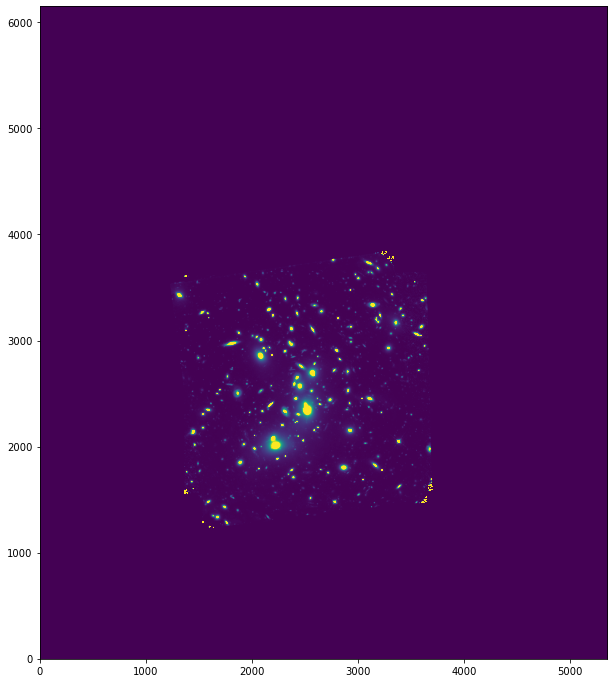

Estimate data noise at dark area
-0.00012860226 0.0038543560076504946 0.010278282687067986


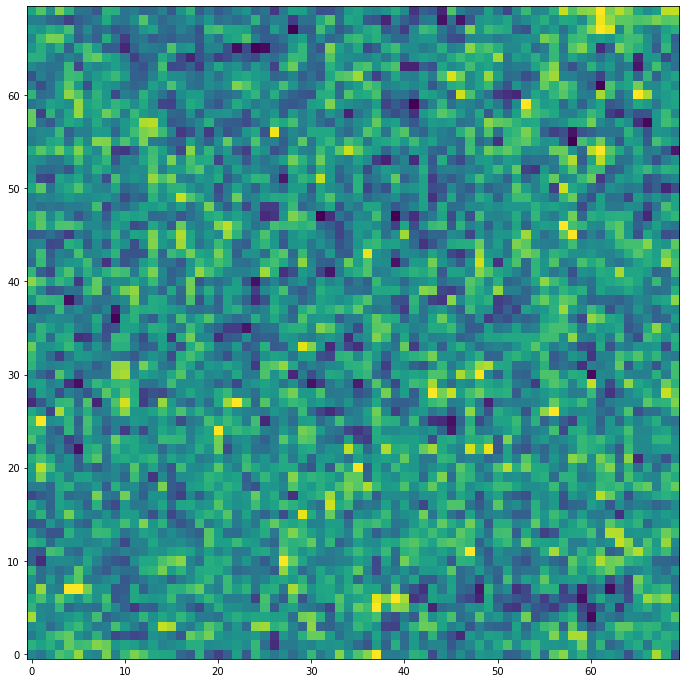

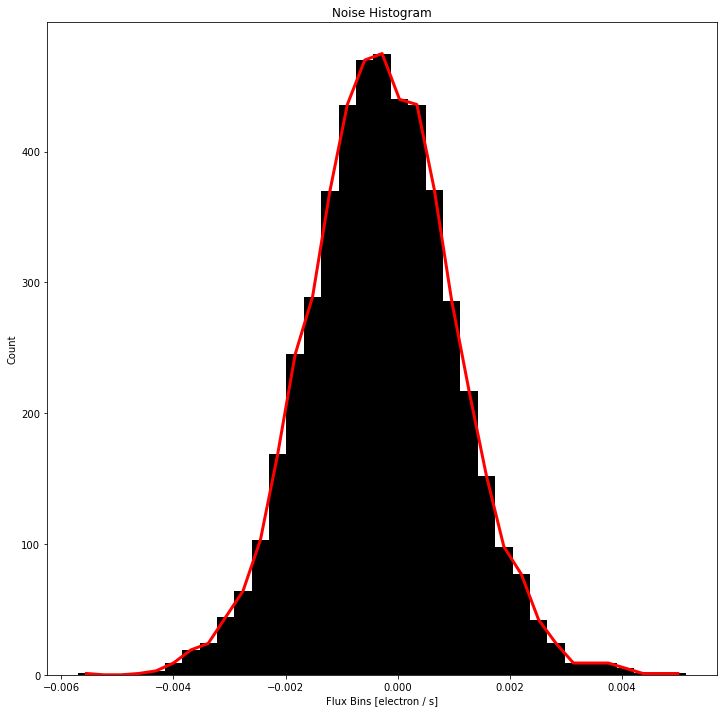

Cutout Image


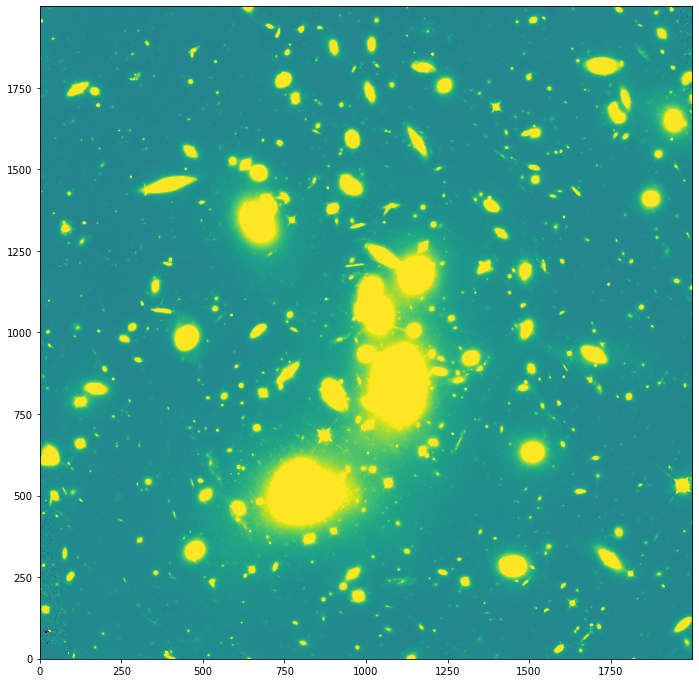

Num of Targets: 573


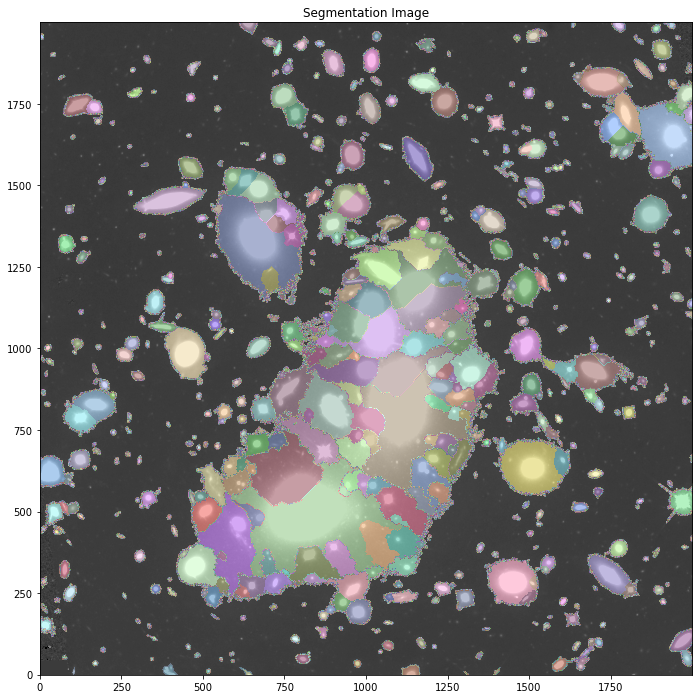

max= 250
len= 250
Photomerty


IntProgress(value=0, description='Loading:', max=573)

Petrosian Calculation


IntProgress(value=0, description='Loading:', max=573)

f125w
Load data and vitals


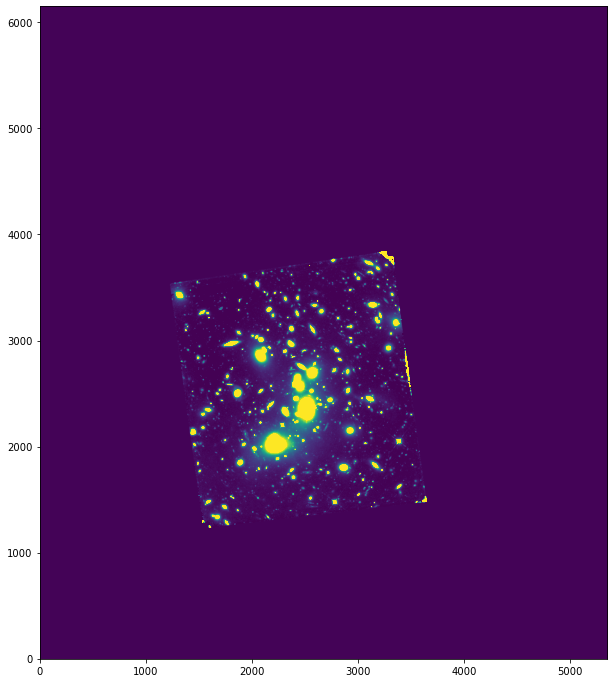

Estimate data noise at dark area
-6.203353e-05 0.004477811744436622 0.011940831318497658


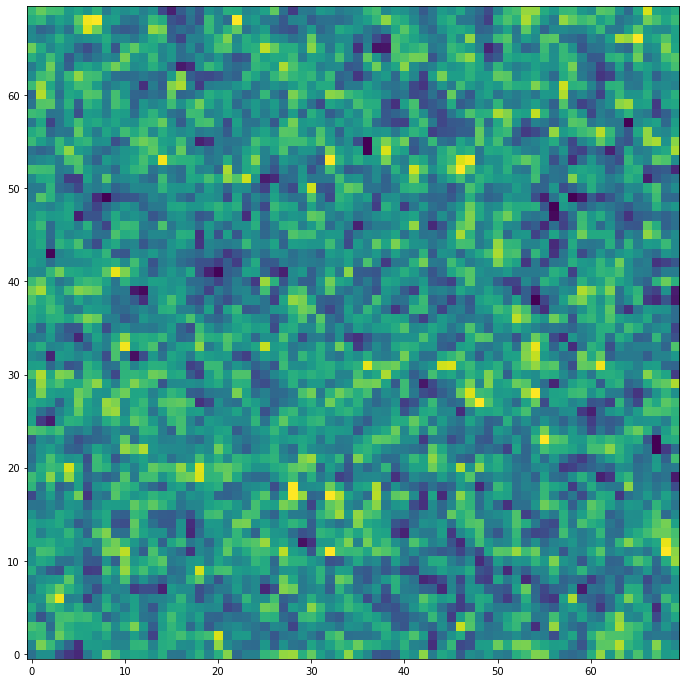

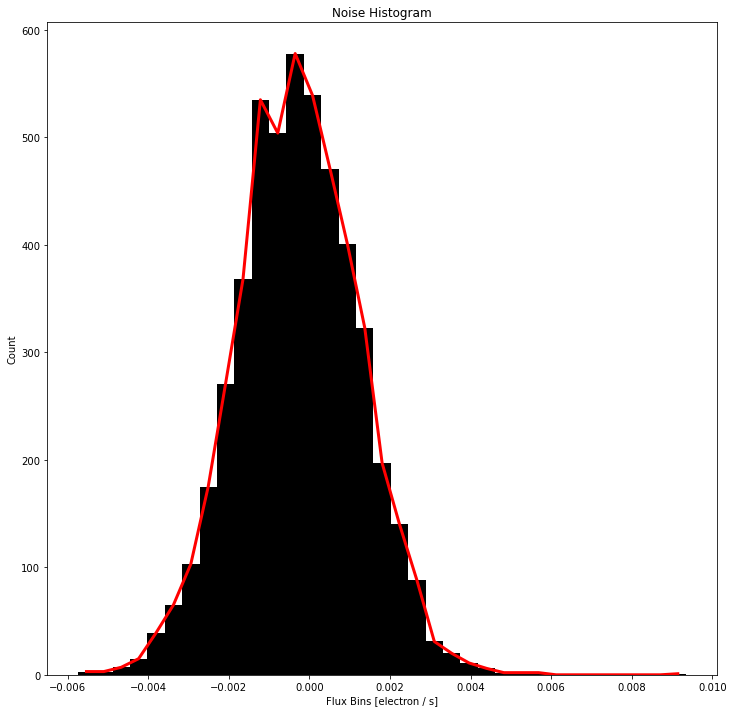

Cutout Image


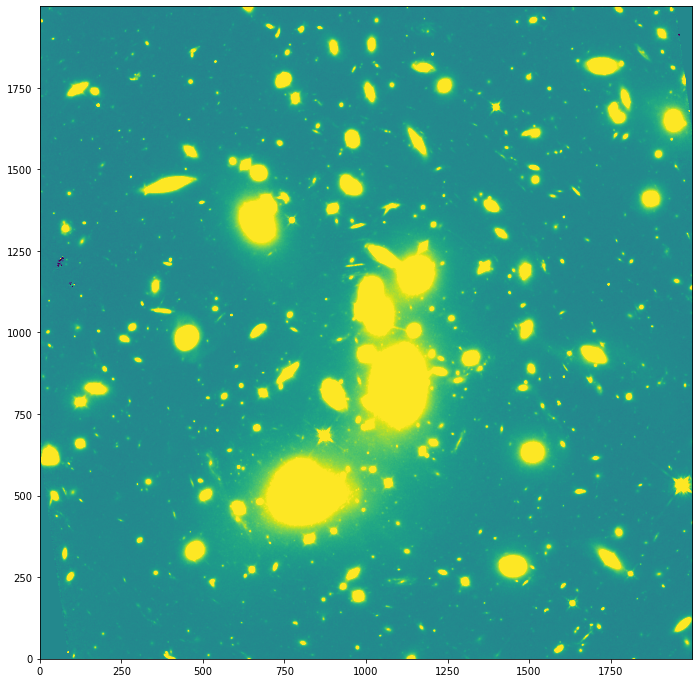

Num of Targets: 573


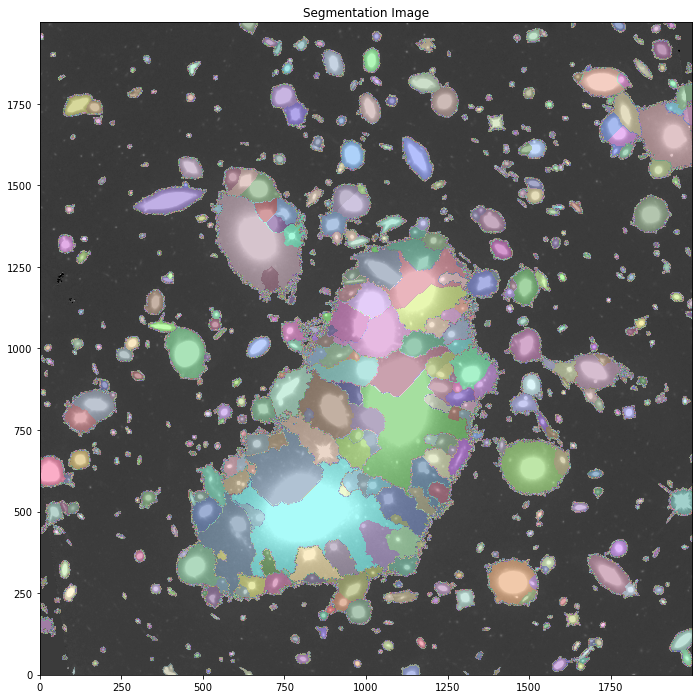

max= 250
len= 250
Photomerty


IntProgress(value=0, description='Loading:', max=573)

Petrosian Calculation


IntProgress(value=0, description='Loading:', max=573)

f140w
Load data and vitals


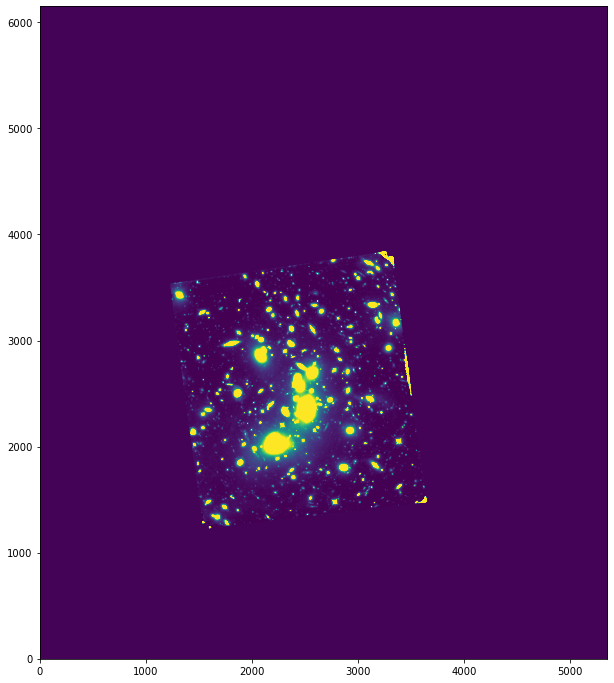

Estimate data noise at dark area
-0.00049139984 0.005283256410621107 0.014088683761656284


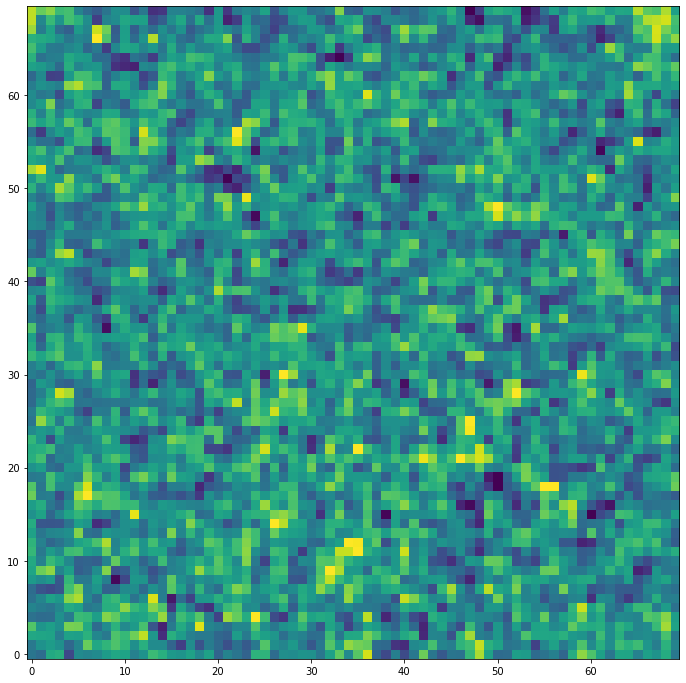

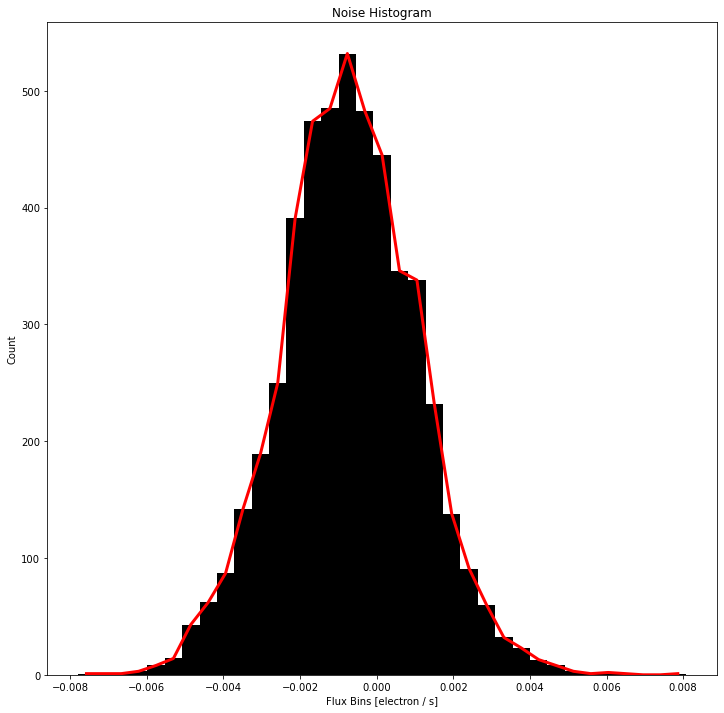

Cutout Image


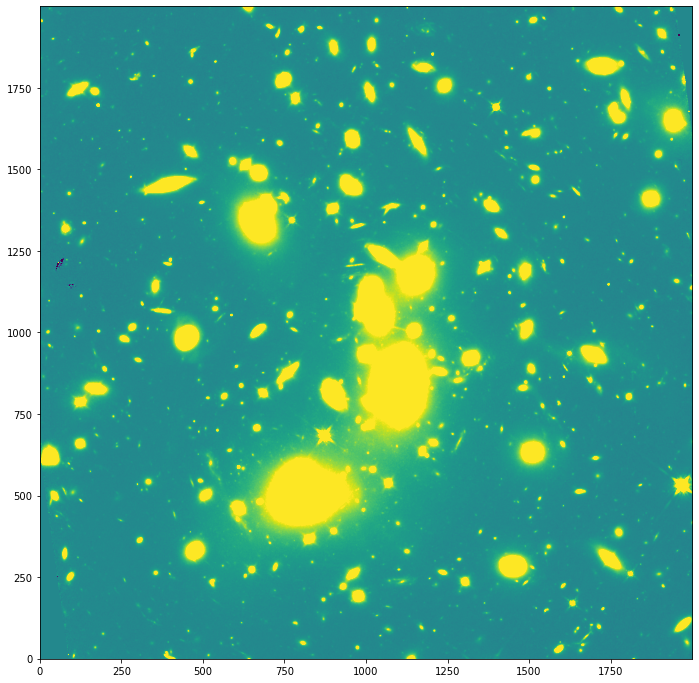

Num of Targets: 573


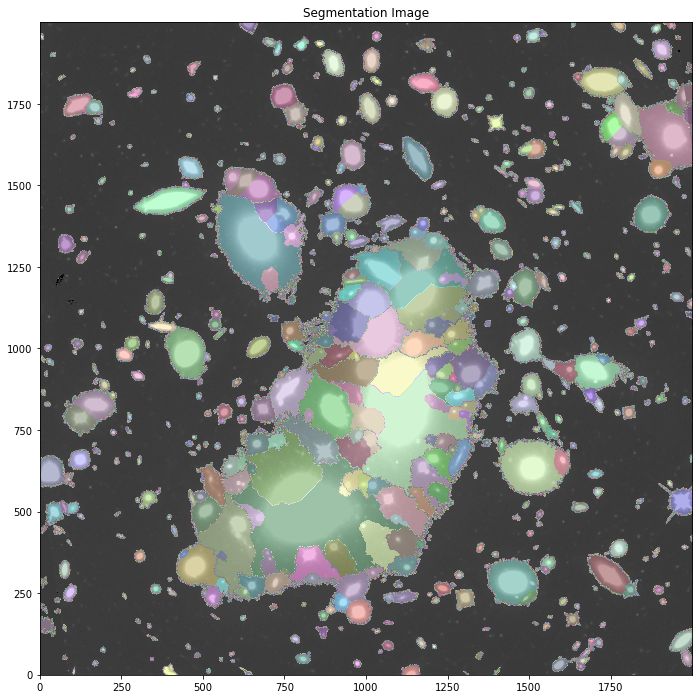

max= 250
len= 250
Photomerty


IntProgress(value=0, description='Loading:', max=573)

Petrosian Calculation


IntProgress(value=0, description='Loading:', max=573)

f160w
Load data and vitals


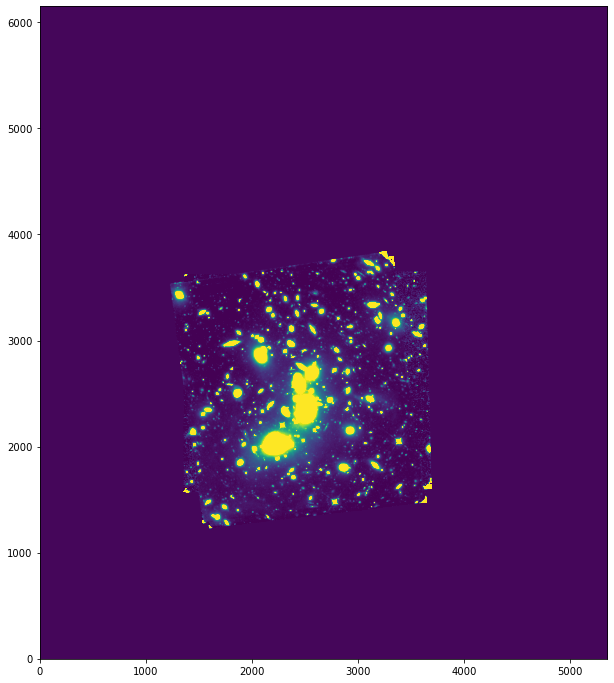

Estimate data noise at dark area
-9.3978415e-05 0.0034356677206233144 0.009161780588328838


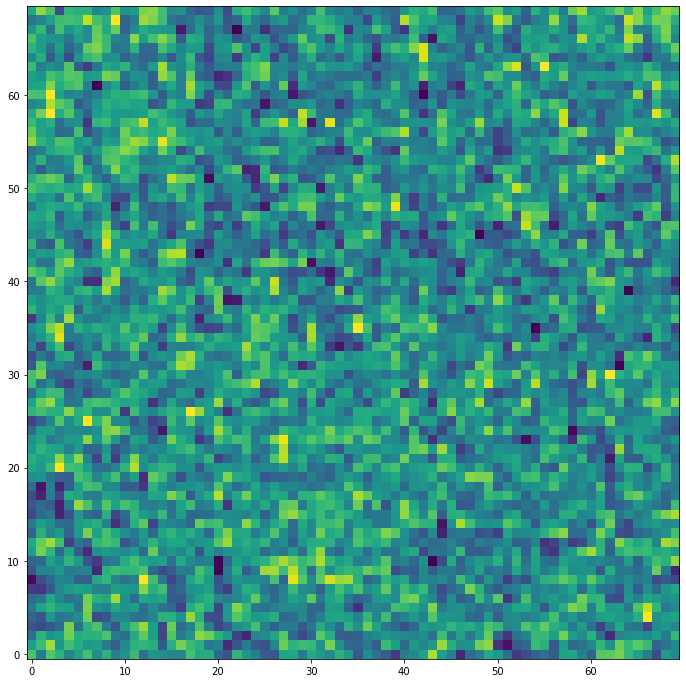

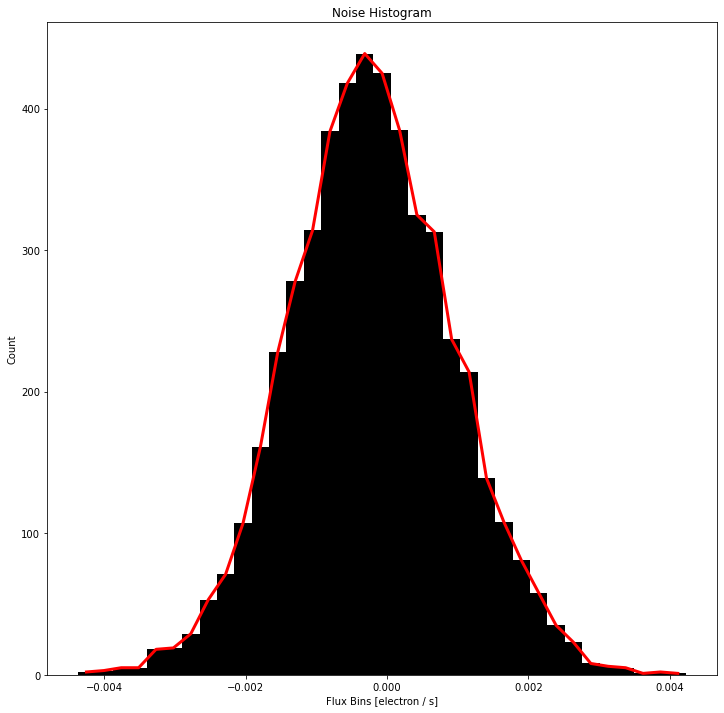

Cutout Image


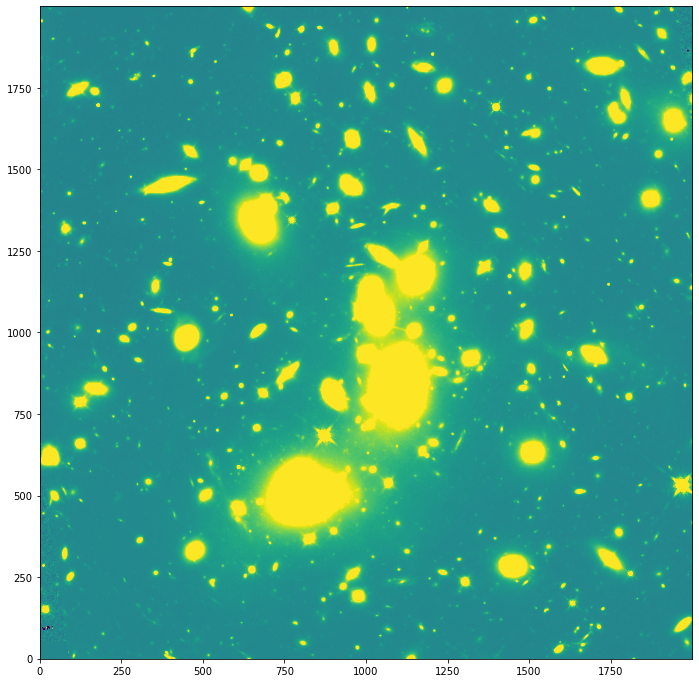

Num of Targets: 573


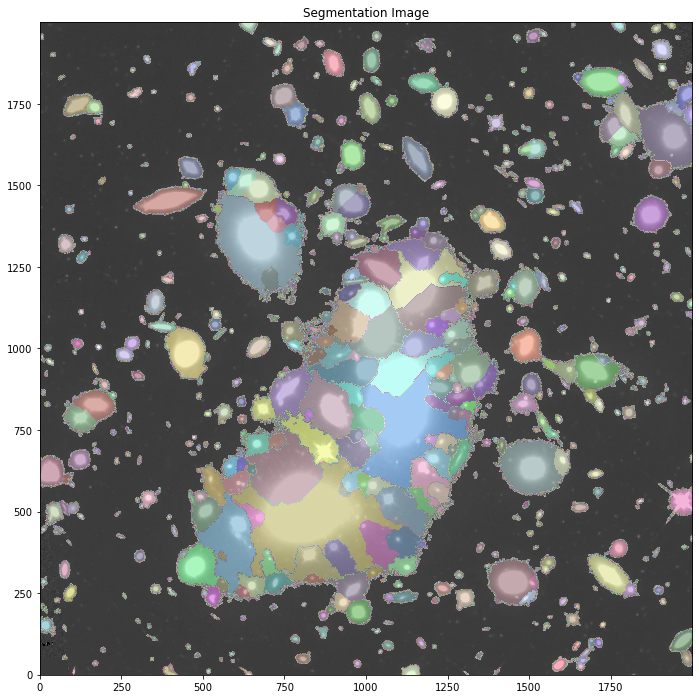

max= 250
len= 250
Photomerty


IntProgress(value=0, description='Loading:', max=573)

Petrosian Calculation


IntProgress(value=0, description='Loading:', max=573)

f435w
Load data and vitals


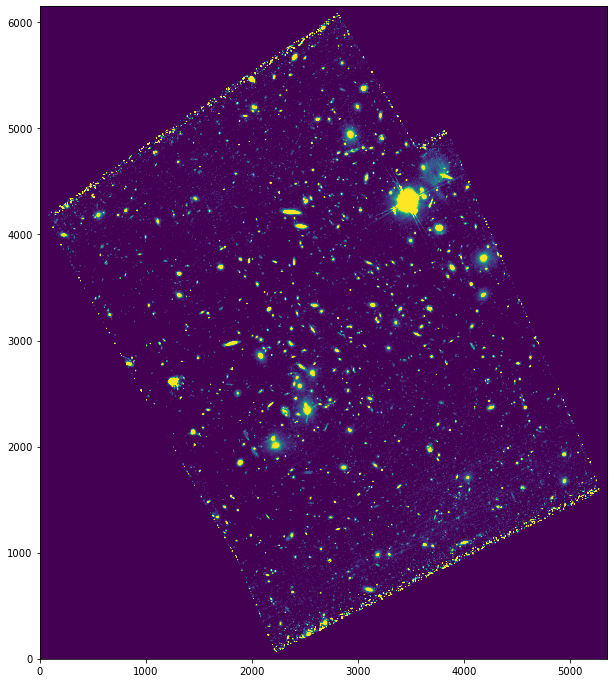

Estimate data noise at dark area
-0.00029898697 0.0060010333545506 0.016002755612134933


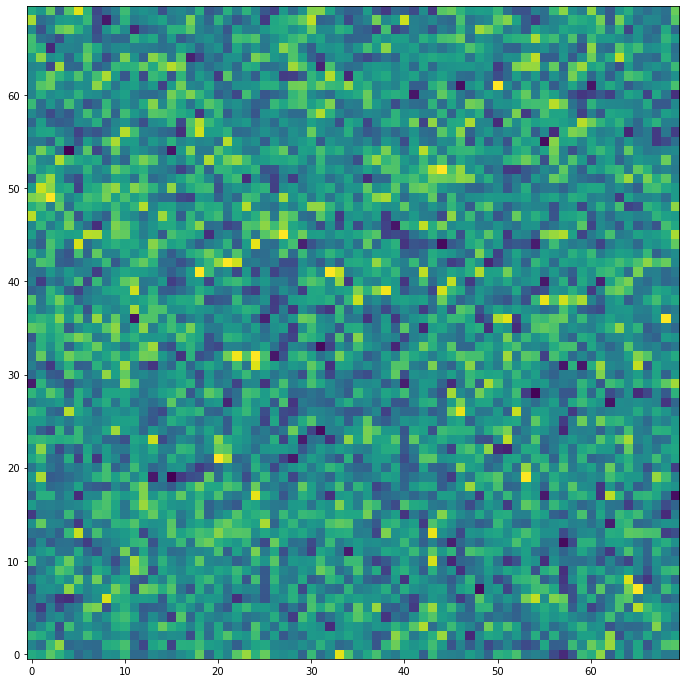

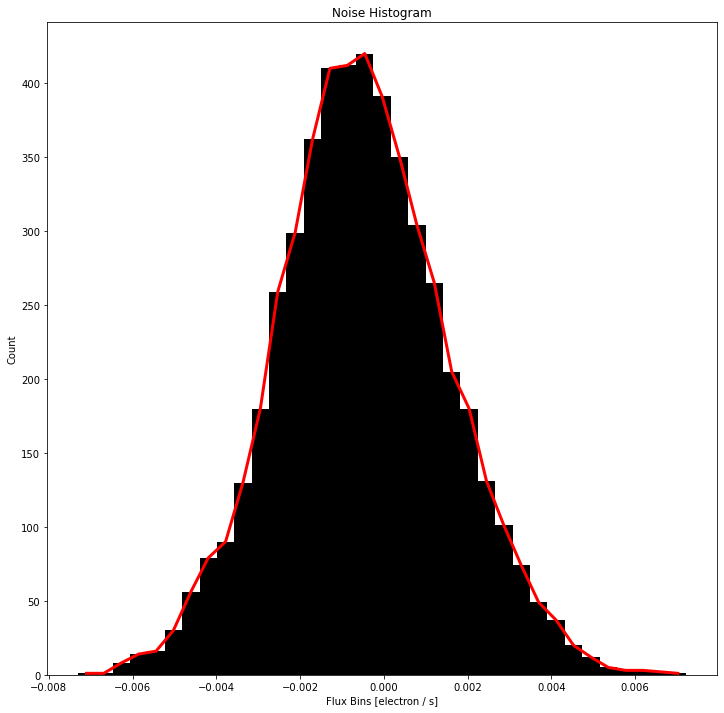

Cutout Image


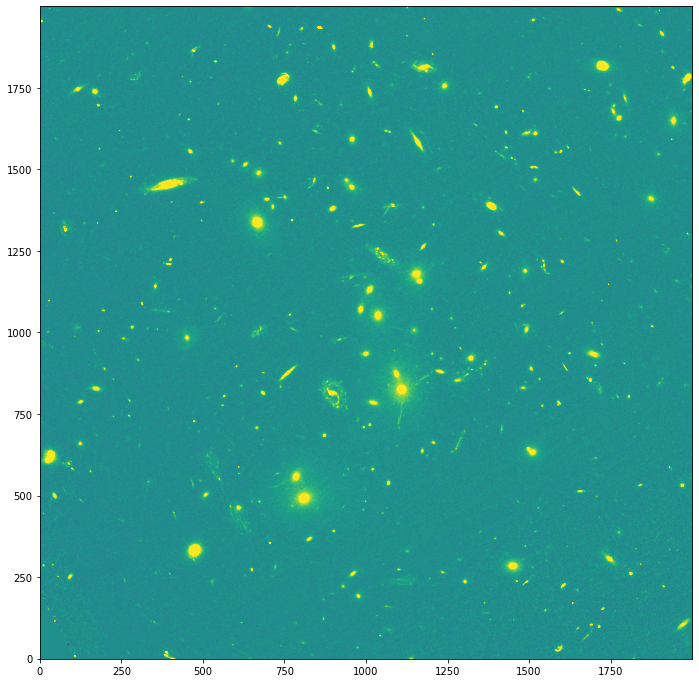

Num of Targets: 573


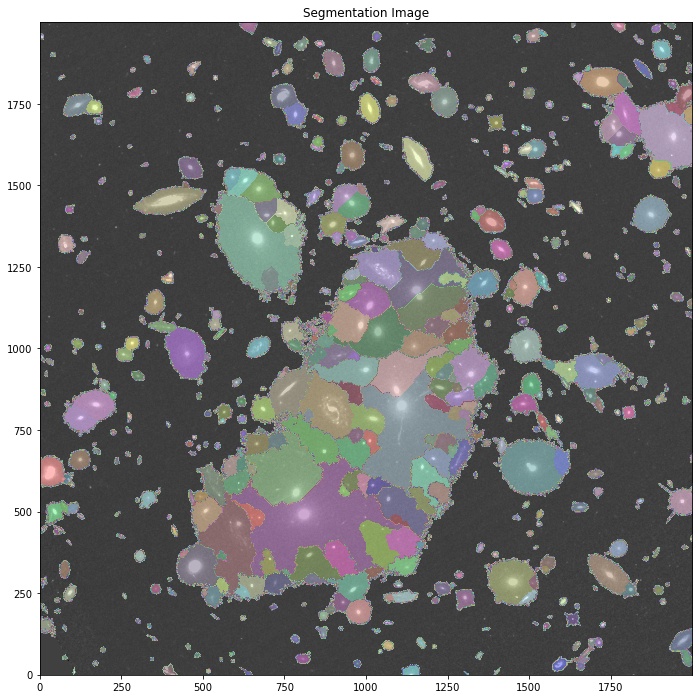

max= 250
len= 250
Photomerty


IntProgress(value=0, description='Loading:', max=573)

Petrosian Calculation


IntProgress(value=0, description='Loading:', max=573)

f606w
Load data and vitals


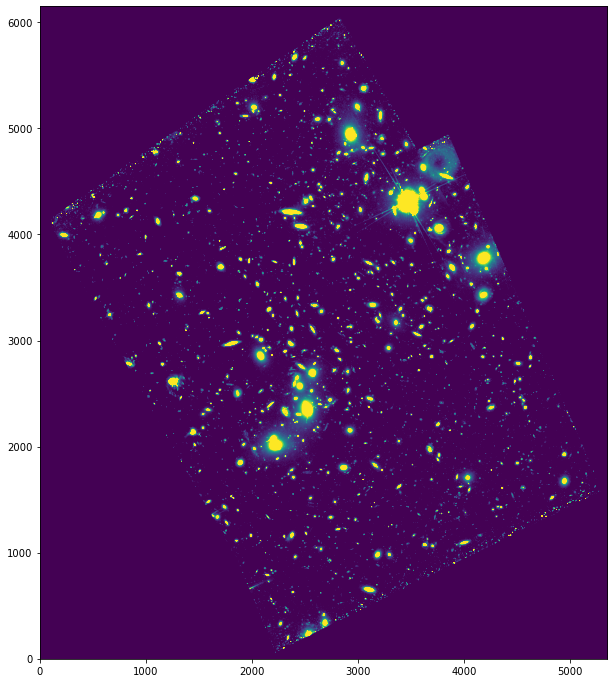

Estimate data noise at dark area
-0.0016426255 0.009777964325621724 0.026074571534991264


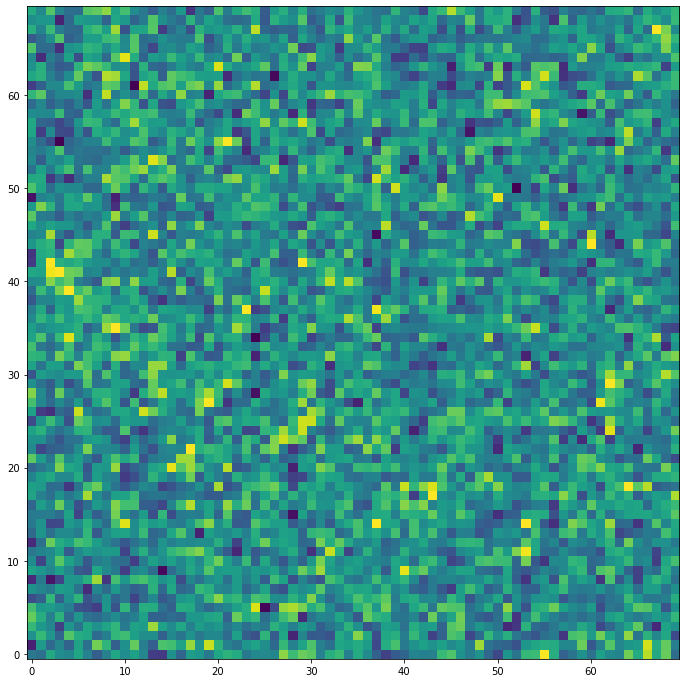

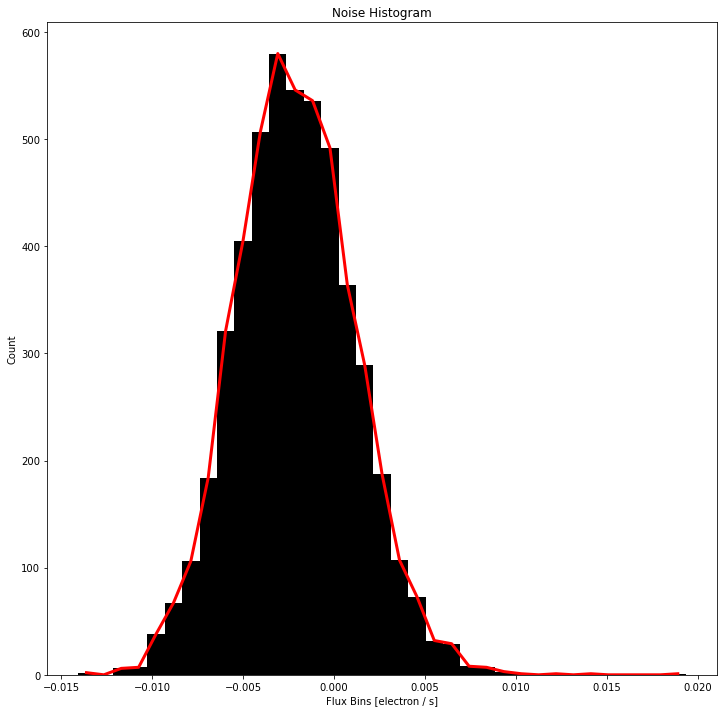

Cutout Image


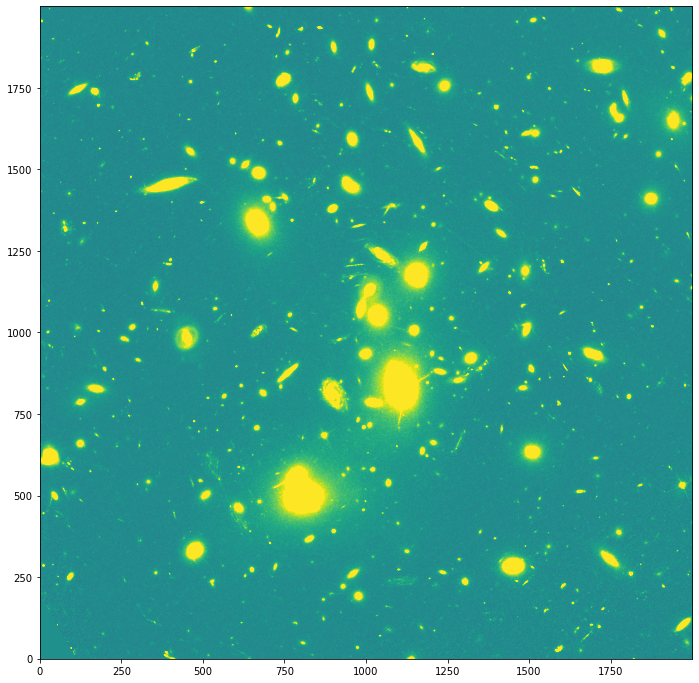

Num of Targets: 573


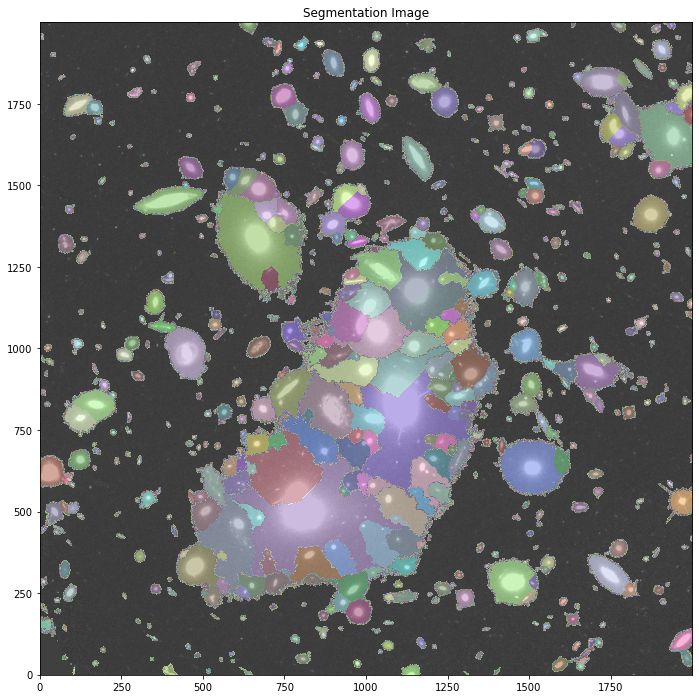

max= 250
len= 250
Photomerty


IntProgress(value=0, description='Loading:', max=573)

Petrosian Calculation


IntProgress(value=0, description='Loading:', max=573)

f814w
Load data and vitals


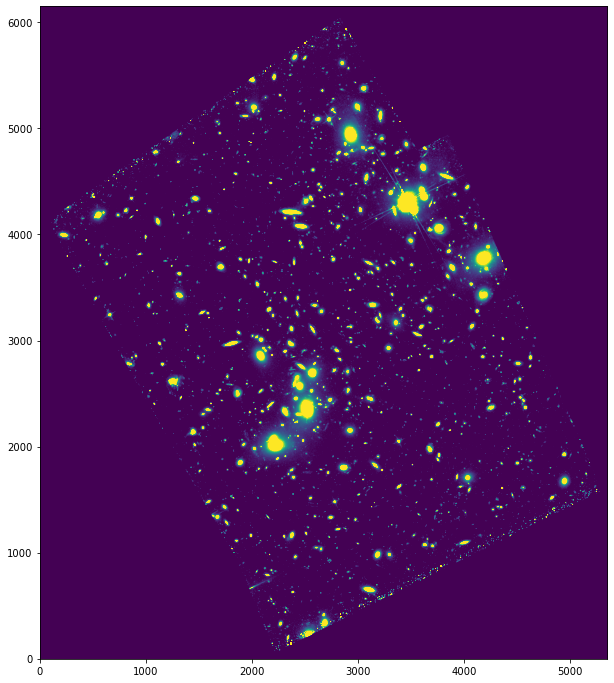

Estimate data noise at dark area
-0.0021046035 0.009056409588083625 0.024150425568223


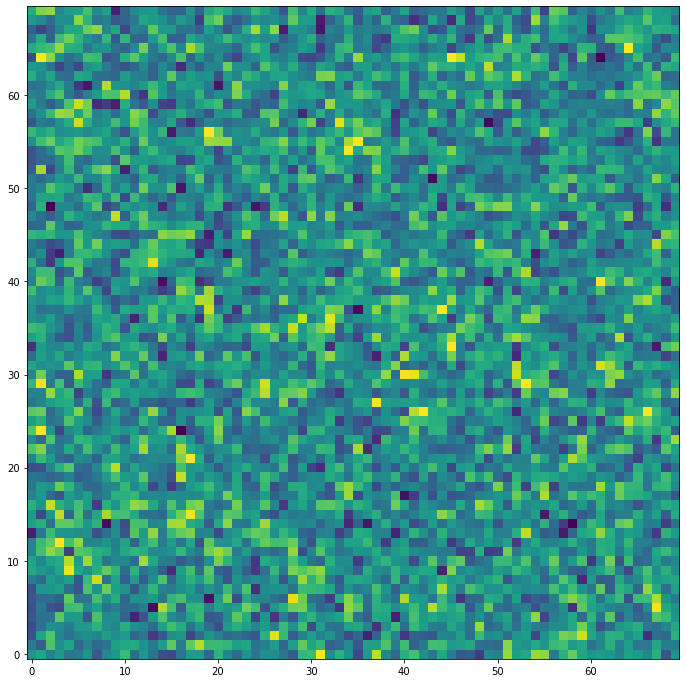

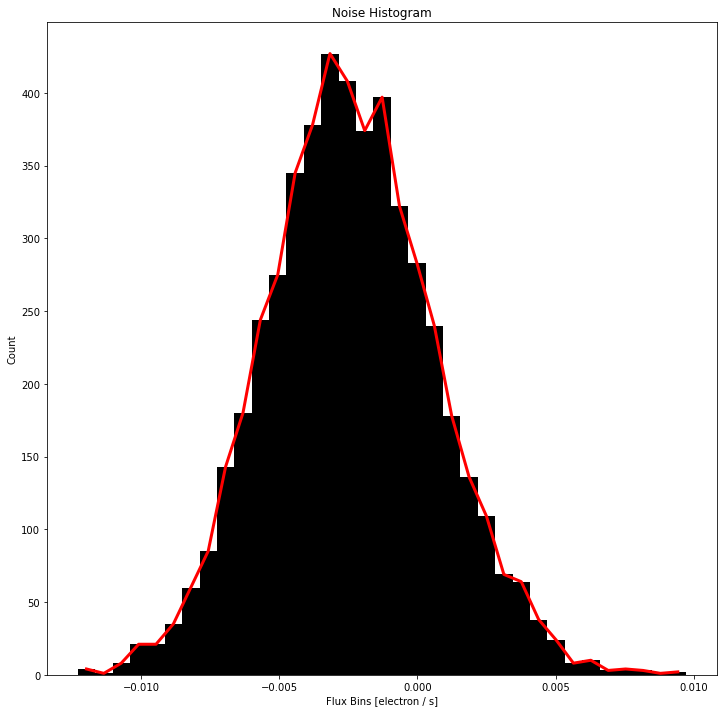

Cutout Image


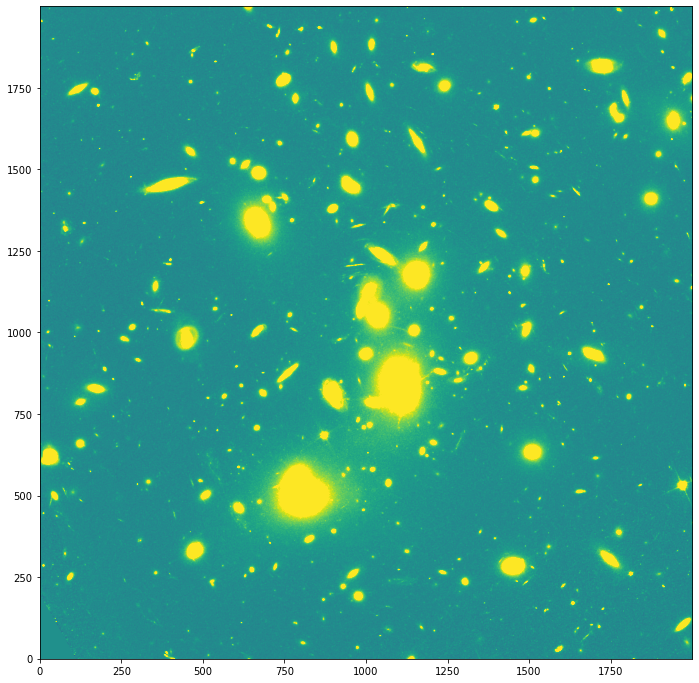

Num of Targets: 573


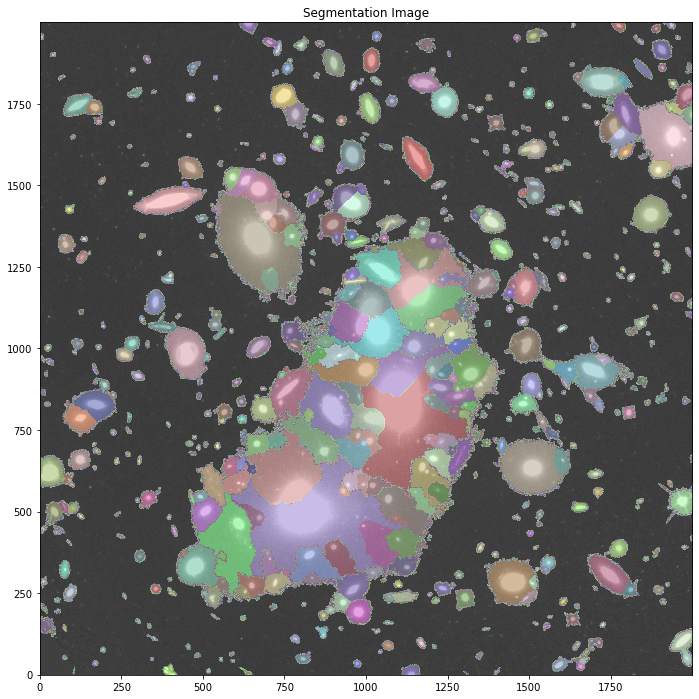

max= 250
len= 250
Photomerty


IntProgress(value=0, description='Loading:', max=573)

Petrosian Calculation


IntProgress(value=0, description='Loading:', max=573)

Done


In [14]:
petrosian_cat_collection = {}

for current_filter in wfc3_filter_list + acs_filter_list:
    print(current_filter)

    input_data_path = data_paths[current_filter]
    output_path = "{}_patrosian_catalog.csv".format(os.path.splitext(os.path.basename(input_data_path))[0])
    
    # Load data and vitals
    # ---------------------
    print('Load data and vitals')
    data = CCDData.read(input_data_path)
    
    if show_plots:
        plt.imshow(data, vmin=0, vmax=data.data.mean()*10)
        plt.show()
        
    # Estimate data noise at dark area
    # --------------------------------
    print('Estimate data noise at dark area')
    noise_cutout = Cutout2D(data, noise_cutout_center, noise_cutout_size)

    noise_mean = noise_cutout.data.mean()
    noise_sigma = noise_cutout.data.std()
    noise_3_sigma = noise_sigma * 3.
    noise_8_sigma = noise_sigma * 8.

    print(noise_mean, noise_3_sigma, noise_8_sigma)
    
    if show_plots:
        plt.imshow(noise_cutout.data, vmax=noise_mean+noise_3_sigma, vmin=noise_mean-noise_3_sigma)
        plt.show()
    
        n, bins, patches = plt.hist(noise_cutout.data.flatten(), bins=35, align='left', color='black')
        plt.plot(bins[:-1], n, c='r', linewidth=3)

    plt.xlabel('Flux Bins [{}]'.format(str(data.unit)))
    plt.ylabel('Count')
    plt.title('Noise Histogram')
    plt.show()
    
    # Cutout Image
    # -------------
    print("Cutout Image")
    image = Cutout2D(data, (cx, cy), data_cutout_size, copy=True)

    # Compute image stats
    image_min = image.data.min()
    image_max = image.data.max()
    image_mean = image.data.mean()
    image_sigma = image.data.std()
    image_3_sigma = image_sigma * 3.
    image_8_sigma = image_sigma * 8.

    image_clipped_mean, image_clipped_median, image_clipped_std = sigma_clipped_stats(image.data, sigma=3.0)

    # Subtract Noise
    image.data  -= image_clipped_mean

    # Set min and max values for all plots
    vmin = -10 * image_clipped_std
    vmax = +10 * image_clipped_std
    
    if show_plots:
        plt.imshow(image.data, vmin=vmin, vmax=vmax)
        plt.show()

    #print(image_mean)
    
    # Segmentation
    # ------------
    
    # Make segmentation map
    segm = combined_cat

    # Deblend segmentation map
    segm_deblend = combined_segm_deblend

    # Remove border sources
    #segm_deblend.remove_border_labels(1)

    # Make catalog
    cat = combined_cat

    # Display source properties
    print("Num of Targets:", len(cat))

    # Plot segments
    if show_plots:
        plot_segments(segm_deblend, image.data, vmin=vmin, vmax=vmax)
        plt.show()
        
    # Define Radii
    # ------------
    # Calculate galaxy size
    galaxy_pixel_size = angular_to_pixel(15 * u.arcsec, wcs=image.wcs) # convert to pixels
    
    # Define max rad in pixels and number of apertures
    max_pix = int(round(galaxy_pixel_size))
    n = int(max_pix)

    # Create list of radii
    r_list = [x * int(max_pix/n) for x in range(1, n+1)]
    r_list = np.array(r_list)
    
    # Print out info
    print("max=", r_list[-1])
    print("len=", len(r_list))

    
    # Photomerty
    # ----------
    print("Photomerty")
    pb = widgets.IntProgress(
        value=0,
        min=0,
        max=len(cat),
        step=1,
        description='Loading:',
        bar_style='',
        orientation='horizontal'
    )
    display(pb)

    single_aperture_photometry_table = cat.to_table()

    aperture_photometry_rows = []
    aperture_area_rows = []
    for idx, obj in enumerate(cat):
        pb.value = idx + 1
        pb.description = "{}/{}".format(pb.value, len(cat))

        aperture_photometry_row, aperture_area_row = object_photometry(obj, image, segm_deblend, r_list, mean_sub=True)

        aperture_photometry_rows.append(np.array(aperture_photometry_row))
        aperture_area_rows.append(aperture_area_row)

    single_aperture_photometry_table.add_columns(np.transpose(aperture_photometry_rows), names=["aperture_sum_{:0>3}".format(r) for r in r_list])
    single_aperture_photometry_table.add_columns(np.transpose(aperture_area_rows), names=["aperture_area_{:0>3}".format(r) for r in r_list])
    #single_aperture_photometry_table.sort(keys="source_sum", reverse=1)
    #single_aperture_photometry_table.write(output_path, format="ascii.csv", overwrite=True)
    plt.show()
    
    result_cat = single_aperture_photometry_table
    
    mag_col_names = natural_sort([i for i in result_cat.colnames if "aperture_sum_" in i])
    area_col_names = natural_sort([i for i in result_cat.colnames if "aperture_area_" in i])

    
    # Petrosian Calculation
    # ---------------------
    print("Petrosian Calculation")
    
    pb = widgets.IntProgress(
        value=0,
        min=0,
        max=len(result_cat),
        step=1,
        description='Loading:',
        bar_style='',
        orientation='horizontal'
    )
    display(pb)
    
    petrosian_rows = []
    for idx, row in enumerate(result_cat):
        pb.value = idx + 1
        pb.description = "{}/{}".format(pb.value, len(result_cat))
        
        area_list = np.array(list(row[area_col_names]))
        flux_list = np.array(list(row[mag_col_names]))

        petrosian_number = 0.2

        r_petrosian = calculate_petrosian_r(r_list, area_list, flux_list, eta=petrosian_number)
        r_half_light = calculate_r_half_light(r_list, area_list, flux_list, eta=petrosian_number)
        r_total_flux = calculate_r_total_flux(r_list, area_list, flux_list, eta=petrosian_number)

        r_half_light_angular = None 
        if r_half_light is not None:
            r_half_light_angular = pixel_to_angular(r_half_light, image.wcs)

        r_total_flux_angular = None 
        if r_total_flux is not None:
            r_total_flux_angular = pixel_to_angular(r_total_flux, image.wcs)

        result = calculate_concentration_index(r_list, area_list, flux_list, 
                                               eta=petrosian_number, ratio1=0.2, ratio2=0.8)
        if result is None:
            r20, r80, c2080 = [None, None, None]
            n_estimate= None
        else:
            r20, r80, c2080 = result
            n_estimate = estimate_n(c2080)

        f = interp1d(r_list, flux_list)

        mag_half_light_err = mag_half_light = f_half_light = None 
        if r_half_light is not None and r_half_light < max(r_list):
            f_half_light = f(r_half_light) 
            mag_half_light = flux_to_abmag(f_half_light, data.header)
            mag_half_light_err = flux_to_abmag(np.sqrt(f_half_light), data.header)

        mag_total_err = mag_total = f_total = None 
        if r_total_flux is not None and r_total_flux < max(r_list):
            f_total = f(r_total_flux)
            mag_total = flux_to_abmag(f_total, data.header)
            mag_total_err = flux_to_abmag(np.sqrt(f_total), data.header)

        new_row = [r_petrosian, r_half_light, r_total_flux, r_half_light_angular, r_total_flux_angular, 
                   r20, r80, c2080, n_estimate, f_half_light, mag_half_light, mag_half_light_err, 
                   f_total, mag_total, mag_total_err]

        new_row_float = []
        for item in new_row:
            if item is not None:
                if isinstance(item, u.Quantity):
                    item = float(item.value)
                else:
                    item = float(item)
            new_row_float.append(item)

        petrosian_rows.append(new_row_float)

    col_names = ['r_petrosian', 'r_half_light', 'r_total_flux', 'r_half_light_arcsec', 'r_total_flux_arcsec', 
                 'r20', 'r80', 'c2080', 'n_estimate', 'f_half_light', 'mag_half_light', 'mag_half_light_err', 
                 'f_total', 'mag_total', 'mag_total_err']

    petrosian_cat = result_cat.copy()

    petrosian_cat.add_columns(list(map(list, zip(*petrosian_rows))),
                              indexes=[36 for i in range(len(col_names))], 
                              names=col_names)
    
    ra, dec = combined_image.wcs.all_pix2world(petrosian_cat['maxval_xpos'], petrosian_cat['maxval_ypos'], 0)
    petrosian_cat.add_column(ra*u.deg, index=1, name="ra")
    petrosian_cat.add_column(dec*u.deg, index=2, name="dec")

    petrosian_cat.write(output_path, format="ascii.csv", overwrite=True)
    petrosian_cat_collection[current_filter] = petrosian_cat
    
print("Done")

# Combine Catalogs

In [64]:
common_colnames = [
    'id', 'ra', 'dec', 
    'sky_centroid', 'sky_centroid_icrs', 
    'area', 'equivalent_radius', 'perimeter',
    'semimajor_axis_sigma', 'semiminor_axis_sigma',
    'orientation', 'eccentricity', 'ellipticity', 'elongation', 
    'covar_sigx2', 'covar_sigxy', 'covar_sigy2',
    'cxx', 'cxy', 'cyy', 'gini',
]


filter_colnames =[
     'r_petrosian',
     'r_half_light',
     'r_total_flux',
     'r_half_light_arcsec',
     'r_total_flux_arcsec',
     'r20',
     'r80',
     'c2080',
     'n_estimate',
     'f_half_light',
     'mag_half_light',
     'mag_half_light_err',
     'f_total',
     'mag_total',
     'mag_total_err',
]

new_catalog = []
new_catalog_colnames = []

for colname in common_colnames:
    # any filt works because these columns are the same for all filters
    filt = list(petrosian_cat_collection.keys())[0] 
    new_catalog.append(np.array(petrosian_cat_collection[filt][colname]))
    new_catalog_colnames.append(colname)
    
    
for colname in filter_colnames:
    for filt in petrosian_cat_collection:
        new_catalog.append(petrosian_cat_collection[filt][colname])
        new_catalog_colnames.append("{}_{}".format(colname, filt))



In [48]:
final_catalog = Table(data=new_catalog, names=new_catalog_colnames)
final_catalog

id,ra,dec,sky_centroid,sky_centroid_icrs,area,equivalent_radius,perimeter,semimajor_axis_sigma,semiminor_axis_sigma,orientation,eccentricity,ellipticity,elongation,covar_sigx2,covar_sigxy,covar_sigy2,cxx,cxy,cyy,gini,r_petrosian_f105w,r_petrosian_f125w,r_petrosian_f140w,r_petrosian_f160w,r_petrosian_f435w,r_petrosian_f606w,r_petrosian_f814w,r_half_light_f105w,r_half_light_f125w,r_half_light_f140w,r_half_light_f160w,r_half_light_f435w,r_half_light_f606w,r_half_light_f814w,r_total_flux_f105w,r_total_flux_f125w,r_total_flux_f140w,r_total_flux_f160w,r_total_flux_f435w,r_total_flux_f606w,r_total_flux_f814w,r_half_light_arcsec_f105w,r_half_light_arcsec_f125w,r_half_light_arcsec_f140w,r_half_light_arcsec_f160w,r_half_light_arcsec_f435w,r_half_light_arcsec_f606w,r_half_light_arcsec_f814w,r_total_flux_arcsec_f105w,r_total_flux_arcsec_f125w,r_total_flux_arcsec_f140w,r_total_flux_arcsec_f160w,r_total_flux_arcsec_f435w,r_total_flux_arcsec_f606w,r_total_flux_arcsec_f814w,r20_f105w,r20_f125w,r20_f140w,r20_f160w,r20_f435w,r20_f606w,r20_f814w,r80_f105w,r80_f125w,r80_f140w,r80_f160w,r80_f435w,r80_f606w,r80_f814w,c2080_f105w,c2080_f125w,c2080_f140w,c2080_f160w,c2080_f435w,c2080_f606w,c2080_f814w,n_estimate_f105w,n_estimate_f125w,n_estimate_f140w,n_estimate_f160w,n_estimate_f435w,n_estimate_f606w,n_estimate_f814w,f_half_light_f105w,f_half_light_f125w,f_half_light_f140w,f_half_light_f160w,f_half_light_f435w,f_half_light_f606w,f_half_light_f814w,mag_half_light_f105w,mag_half_light_f125w,mag_half_light_f140w,mag_half_light_f160w,mag_half_light_f435w,mag_half_light_f606w,mag_half_light_f814w,mag_half_light_err_f105w,mag_half_light_err_f125w,mag_half_light_err_f140w,mag_half_light_err_f160w,mag_half_light_err_f435w,mag_half_light_err_f606w,mag_half_light_err_f814w,f_total_f105w,f_total_f125w,f_total_f140w,f_total_f160w,f_total_f435w,f_total_f606w,f_total_f814w,mag_total_f105w,mag_total_f125w,mag_total_f140w,mag_total_f160w,mag_total_f435w,mag_total_f606w,mag_total_f814w,mag_total_err_f105w,mag_total_err_f125w,mag_total_err_f140w,mag_total_err_f160w,mag_total_err_f435w,mag_total_err_f606w,mag_total_err_f814w
,deg,deg,"deg,deg","deg,deg",pix2,pix,pix,pix,pix,deg,,,,pix2,pix2,pix2,1 / pix2,1 / pix2,1 / pix2,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
int64,float64,float64,object,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,object,object,object,float64,object,object,object,object,object,object,float64,object,object,float64,float64,float64,float64,float64,float64,float64,object,object,object,object,float64,object,object,float64,float64,float64,float64,float64,float64,float64,object,object,object,object,float64,object,object,object,object,object,object,float64,object,object,object,object,object,object,float64,object,object,object,object,object,object,float64,object,object,object,object,object,object,float64,object,object,object,object,object,object,float64,object,object,object,object,object,object,float64,object,object,object,object,object,object,float64,object,object,object,object,object,object,float64,object,object,object,object,object,object,float64,object,object
340,3.5920412239129766,-30.405724462842198,"3.5918350117300015,-30.40577386691768","3.591831981054973,-30.405776043424044",78109.0,157.67963375125436,2911.6836918456834,64.65954840999994,39.55928973204576,14.933298493311165,0.7910055762903719,0.3881910606426736,1.6344972027549127,4007.1434054583888,651.340827045699,1738.6511992306787,0.0002657358567073645,-0.00019910216926783122,0.0006124527370814362,0.6742887278348707,134.19183836767354,128.9119823964793,125.17623524704942,124.13022604520904,116.0610122024405,135.9351870374075,133.84316863372675,None,None,None,48.76775355071015,53.94798959791959,None,None,268.3836767353471,257.8239647929586,250.35247049409884,248.26045209041808,232.122024404881,271.870374074815,267.6863372674535,None,Non

In [62]:
filt = wfc3_filter_list[0] # any filter would do 
input_data_path = data_paths[filt]
filename = os.path.splitext(os.path.basename(input_data_path))[0]
filename = "_".join([item for item in filename.split("_") if "acs" not in item and "wfc" not in item and filt not in item ])

output_path = "{}_patrosian_catalog.csv".format(filename)
print(output_path)

final_catalog.write(output_path)

hlsp_frontier_hst_abell2744_v1.0_drz_patrosian_catalog.csv


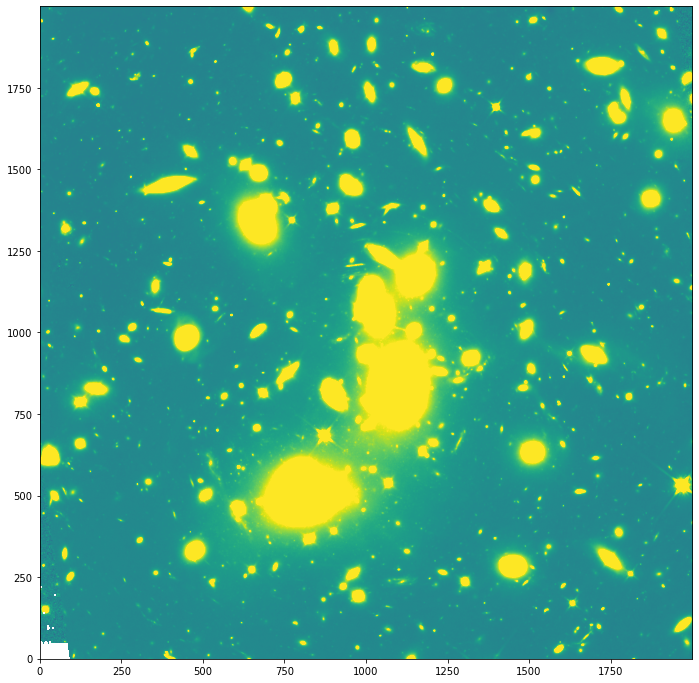

In [65]:
raw_astro_deep_cat = Table.read("http://data.muse-vlt.eu/A2744/A2744_redshifts_cat_final.csv")




In [83]:
min_z = 0.1
max_z = 1

min_mag = -np.inf
max_mag = np.inf

astro_deep_mask = np.ones((len(raw_astro_deep_cat))).astype(bool)

#astro_deep_mask = astro_deep_mask & np.invert(raw_astro_deep_cat['ZBEST'].mask.astype(bool))
astro_deep_mask = astro_deep_mask & (raw_astro_deep_cat['Z'] > min_z).astype(bool).data  
astro_deep_mask = astro_deep_mask & (raw_astro_deep_cat['Z'] < max_z).astype(bool).data 
astro_deep_mask = astro_deep_mask & (raw_astro_deep_cat['Z'] != 0).astype(bool).data 


astro_deep_cat = raw_astro_deep_cat[astro_deep_mask]
print(len(astro_deep_cat))

228


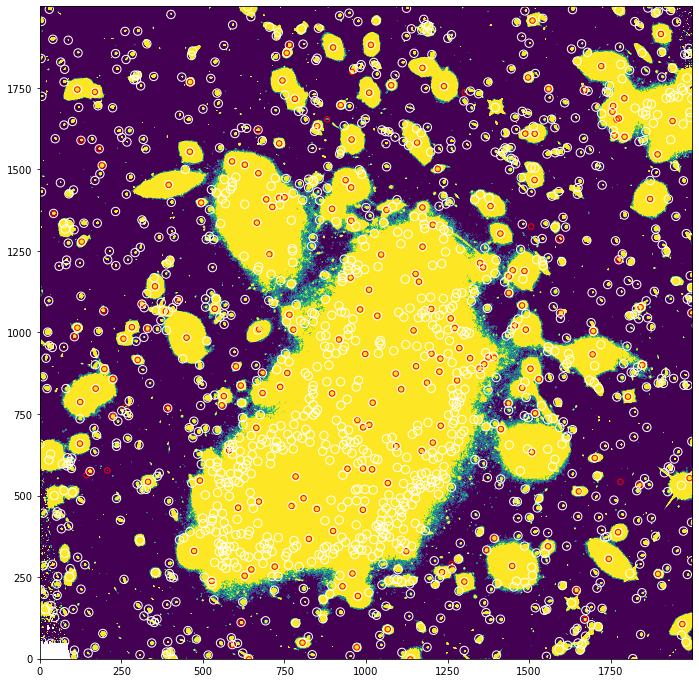

In [204]:
cat = combined_cat.to_table()
x, y = combined_image.wcs.all_world2pix(astro_deep_cat["RA"], astro_deep_cat["DEC"], 0)
plt.scatter(x, y, s=30, facecolors='none',  edgecolors='red')
plt.scatter(cat["maxval_xpos"], cat["maxval_ypos"], s=70, facecolors='none',  edgecolors='white')
plt.imshow(combined_image.data, vmin=0, vmax=combined_noise_3_sigma)

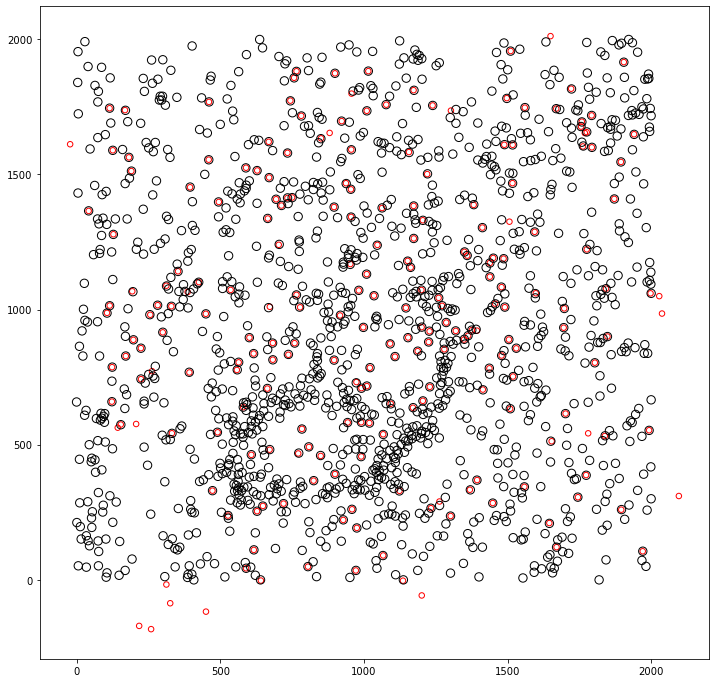

In [205]:
x, y = combined_image.wcs.all_world2pix(astro_deep_cat["RA"], astro_deep_cat["DEC"], 0)
plt.scatter(x, y, s=30, facecolors='none',  edgecolors='red')
plt.scatter(cat["maxval_xpos"], cat["maxval_ypos"], s=70, facecolors='none',  edgecolors='black')
#plt.imshow(combined_image.data, vmin=0, vmax=combined_noise_3_sigma)

In [206]:
from astropy.coordinates import SkyCoord

In [207]:
robel_cat = cat

robel_ra, robel_dec = combined_image.wcs.all_pix2world(robel_cat['maxval_xpos'], robel_cat['maxval_ypos'], 0)
robel_coords = SkyCoord(
    ra=robel_ra*u.degree,
    dec=robel_dec*u.degree
)


astro_deep_coords = SkyCoord(
    ra=np.array(astro_deep_cat['RA'])*u.degree,
    dec=np.array(astro_deep_cat['DEC'])*u.degree
)


idx, sep2d, dist3d = astro_deep_coords.match_to_catalog_sky(robel_coords)

arcsec_cutoff = 0.5

radii = []

#radii = np.array(radii, dtype=np.float)
#radii[np.where(sep2d.arcsec > arcsec_cutoff)] = np.nan

num_matches = np.where(sep2d.arcsec < arcsec_cutoff)[0].shape[0]
print("Num sources with radii matchs: ", num_matches, "({})".format(len(astro_deep_cat)-num_matches))
print("Fraction sources with radii matchs: ", 1 - np.where(sep2d.arcsec > arcsec_cutoff)[0].shape[0] / len(astro_deep_cat))
#print("Number of nan values", np.where(np.isnan(radii))[0].shape[0])

Num sources with radii matchs:  207 (21)
Fraction sources with radii matchs:  0.9078947368421053


In [151]:
vmin = -10 * image_clipped_std
vmax = +10 * image_clipped_std